In [1]:
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
import numpy as np
import os
import random
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from matplotlib.lines import Line2D



## Here we get the images of the characters

In [2]:
dir_path="/Users/camiloariasabad/Desktop/Teaching/Topics_Algorithms_2023/Notebooks_for_Topics_on_Algorithms/Explora_Gale_Shapley/Images_Gale_Shapley"
dir_path_women=dir_path+"/Women"
dir_path_men=dir_path+"/Men"
women_image_paths = os.listdir(dir_path_women)
women_image_paths=[dir_path_women+"/"+item for item in women_image_paths if item[-1]=="g"]
women_image_paths.sort()
men_image_paths=os.listdir(dir_path_men)
men_image_paths=[dir_path_men+"/"+item for item in men_image_paths if item[-1]=="g"]
men_image_paths.sort()
image_paths=women_image_paths+men_image_paths
men_names=[item.split('/')[-1] for item in men_image_paths]
men_names=[name.split('.')[0] for name in men_names]
women_names=[item.split('/')[-1] for item in women_image_paths]
women_names=[name.split('.')[0] for name in women_names]


In [11]:
men_names

['Bob', 'Dan', 'Fer', 'Jay', 'Leo', 'Nat', 'Sam', 'Teo']

In [12]:
women_names

['Ada', 'Eva', 'Lea', 'Mia', 'Pia', 'Tea', 'Uma', 'Zoe']

In [13]:
def textsize(text, font):
    im = Image.new(mode="P", size=(0, 0))
    draw = ImageDraw.Draw(im)
    _, _, width, height = draw.textbbox((0, 0), text=text, font=font)
    return width, height

In [301]:
def write_name(image_path):
    with Image.open(image_path) as img:
        draw = ImageDraw.Draw(img)
        # Split the path by the forward slash
        parts = image_path.split('/')

        # The last part is the file name and remove extention
        text = parts[-1].split(".")[0]
    
        # Access the built-in "DejaVuSans" font
        #Use the default font
        font_size=250
        font = ImageFont.truetype("DejaVuSans.ttf", font_size)
        
        # Position and color
        text_width, text_height =textsize(text, font=font)
        # Calculate the x-coordinate for the text to be centered
        x = (img.width - text_width) / 2
        # Set the y-coordinate for the vertical position
        y = 0.7*(img.height)  # For example, 10 pixels from the top

        text_position = (x, y)
        text_color = "#52b788"
        
        # Draw the text
        draw.text(text_position, text, fill=text_color, font=font)
        
        # Save or display the image
        # output_path = 'path_to_your_output_image.jpg'
        # img.save(output_path)
        return img

In [302]:
Women=[write_name(path) for path in women_image_paths ]
Men=[write_name(path) for path in men_image_paths ]
People=Women+Men

In [303]:
image_dict=dict()
for i,name in enumerate(women_names):
    image_dict[name]=Women[i]
for i,name in enumerate(men_names):
    image_dict[name]=Men[i]

In [304]:
image_dict[men_names[3]].show()

In [278]:

random.choice(People).show()

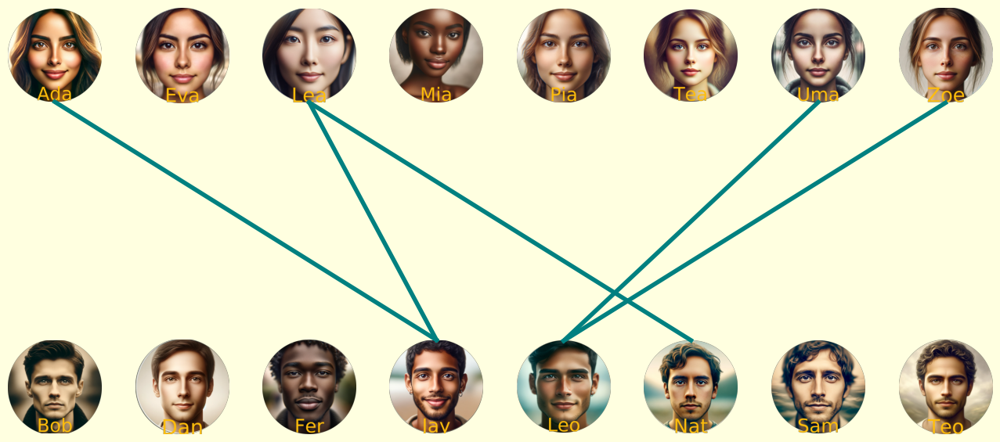

In [279]:


# Number of images
n_images = len(image_paths)

# Grid size
cols = 8  # Set the number of columns you want in your grid
rows = n_images // cols + (n_images % cols > 0)  # Calculate the number of rows needed

# Create a figure to hold the grid
fig, axs = plt.subplots(rows, cols, figsize=(13, 13))
fig.tight_layout(pad=0)
## Adjust vertical space
fig.subplots_adjust(hspace=-0.5)
fig.patch.set_facecolor('lightyellow')
# Hide unused subplots if the number of images is not a perfect fit for the grid
if n_images % cols > 0:
    for idx in range(n_images, rows * cols):
        axs.flat[idx].axis('off')

# # Loop through the images and add them to the grid
# for i, img_papth in enumerate(image_paths):
#     img = Image.open(img_path)
#     ax = axs.flat[i]
#     ax.imshow(img)
#     ax.axis('off')  # Hide the axis
        

# Loop through the images and add them to the grid
for i, img in enumerate(People):
    ax = axs.flat[i]
    ax.imshow(img)
    ax.axis('off')  # Hide the axis        
coordinates=[]
for i, ax in enumerate(axs.flat):
    position = ax.get_position()
    DX=position.width/2
    DY=position.height
    if i<8:
        DY=0
    coordinates.append((position.x0+DX,position.y0+DY))
for i in range(5):
    a=np.random.choice(range(8))
    b=np.random.choice(range(8))+8
    plt.plot([coordinates[a][0], coordinates[b][0]], [coordinates[a][1], coordinates[b][1]], color="Teal",transform=fig.transFigure, clip_on=False,lw=4)

plt.show()

## This function draws a comitment tree

In [365]:
def draw_commitments(people:list, proposals:list, relationships:list,title:str,p_matrix,d_matrix):
    # Assuming 'people' contains paths to image files or PIL images
    n_images = len(people)

    # Calculate grid size
    cols = max(1, n_images // 2)  # Ensure there's at least one column
    rows = n_images // cols + (n_images % cols > 0)
    circle_size=50/cols

    # Create figure and axes for the grid
    fig, axs = plt.subplots(rows, cols, figsize=(circle_size, circle_size))
    #add title
   
   
    # Add a title to the figure
    fig.suptitle(title, fontsize=20,color="#1D3557",y=1)  # You can adjust the fontsize as needed

    # Add a title
    fig.tight_layout(pad=0)
    fig.subplots_adjust(hspace=-0.2)  # Adjust vertical space
    fig.patch.set_facecolor('#F1FAEE')

    # Hide unused subplots
    if n_images % cols > 0:
        for idx in range(n_images, rows * cols):
            axs.flat[idx].axis('off')

    # Load and display each image
    people_images=[image_dict[name] for name in people]
    for i, person in enumerate(people_images):
        if isinstance(person, str):  # Check if 'person' is a path to an image
            img = Image.open(person)
        else:
            img = person  # Assuming 'person' is already a PIL image
        ax = axs.flat[i]
        ax.imshow(img)
        ax.axis('off')

    # Example for drawing lines
    coordinates = []
    for i, ax in enumerate(axs.flat[:n_images]):  # Only consider axes with images
        position = ax.get_position()
        dx = position.width / 2
        dy = position.height if i >= cols else 0
        coordinates.append((position.x0 + dx, position.y0 + dy))

    # Draw random lines for demonstration
    for (a,b) in proposals:
        plt.plot([coordinates[a][0], coordinates[b][0]], [coordinates[a][1], coordinates[b][1]], color="#1D3557", transform=fig.transFigure, clip_on=False, lw=2)
    for (a,b) in relationships:
        plt.plot([coordinates[a][0], coordinates[b][0]], [coordinates[a][1], coordinates[b][1]], color="#E63946", transform=fig.transFigure, clip_on=False, lw=2)

    ### Preference table 
   # Define the matrix/data for your table
    

    proponents=people[:cols]
    disponents=people[cols:]

    # Create an axes area for the table
    # The position is [left, bottom, width, height] in figure coordinate system
    proponent_table_ax = fig.add_axes([0.1, 0.75, 0.4, 0.3])  # Adjust as needed
    proponent_table_ax.axis('off')  # Hide the axes

    # Create the table
    p_table = proponent_table_ax.table(cellText=p_matrix, rowLabels=proponents, loc='center', cellLoc='center')
    p_table.auto_set_font_size(False)  # Disable automatic font size adjustment
    p_table.set_fontsize(10)  # Set font size
   ###
    
    # Set the background color for all cells, including header cells
    table_cells = p_table.properties()["celld"]
    background_color = "#A8DADC"  # Light red, for example

    for cell in table_cells.values():
        cell.set_facecolor(background_color)
        cell.set_edgecolor('lightyellow')  # You can also change the border color here

    # The position is [left, bottom, width, height] in figure coordinate system
    disponent_table_ax = fig.add_axes([0.6, 0.75, 0.4, 0.3])  # Adjust as needed
    disponent_table_ax.axis('off')  # Hide the axes

    # Create the table
    d_table = disponent_table_ax.table(cellText=d_matrix, rowLabels=disponents, loc='center', cellLoc='center')
    d_table.auto_set_font_size(False)  # Disable automatic font size adjustment
    d_table.set_fontsize(10)  # Set font size
    # Creating the table at the bottom of the plot
    # Set the background color for all cells, including header cells
    table_cells = d_table.properties()["celld"]
    background_color = "#457B9D"  # Light red, for example

    for cell in table_cells.values():
        cell.set_facecolor(background_color)
        cell.set_edgecolor('#F1FAEE')  # You can also change the border color here
    return fig,axs


In [366]:
def generate_random_matrix(rows, cols, min_val=0, max_val=9):
    """
    Generates a random matrix of integers of the specified size.
    
    Parameters:
    - rows: Number of rows in the matrix.
    - cols: Number of columns in the matrix.
    - min_val: Minimum value of integers (inclusive).
    - max_val: Maximum value of integers (inclusive).
    
    Returns:
    - A list of lists representing the random matrix.
    """
    # Generate the random matrix using numpy for convenience
    matrix = np.random.randint(min_val, max_val + 1, size=(rows, cols))
    
    # Convert the numpy array to a list of lists and return
    return matrix.tolist()

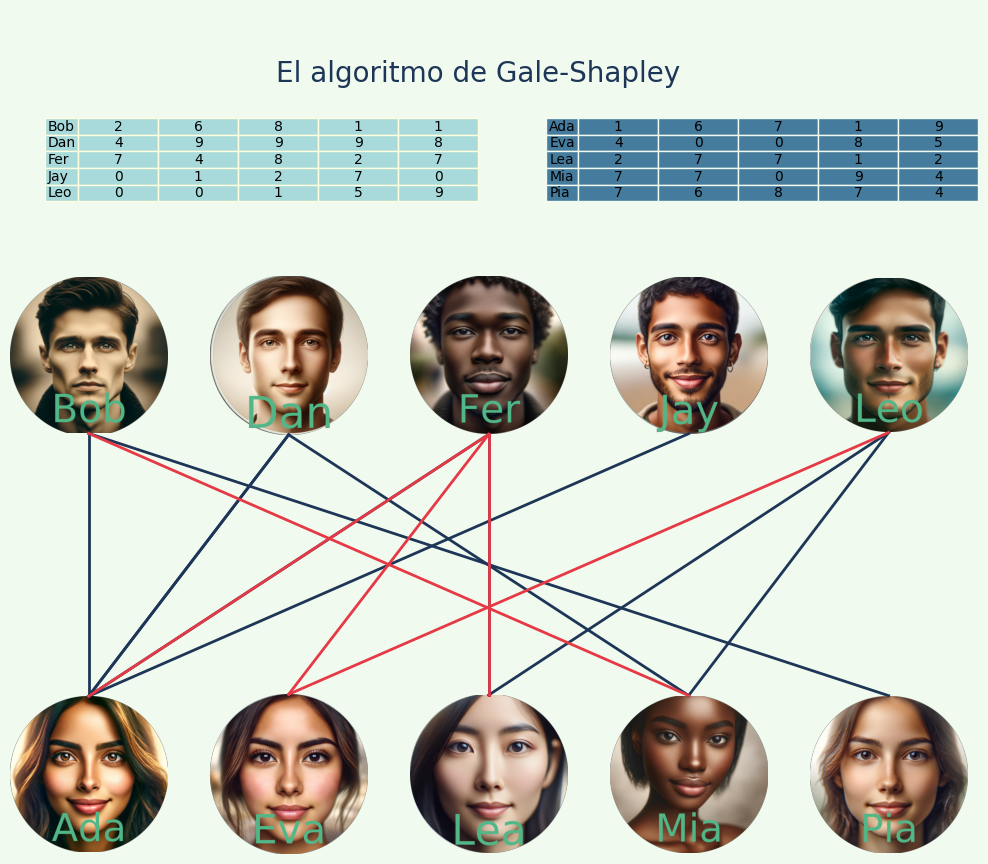

In [367]:
matrix = [[1, 2, 3], [4, 5, 6], [7, 8, 9],[3,4,5],[4,6,2],[3,4,5]]  # Example matrix
k=np.random.choice(range(4,6))
n=2*k
p_matrix =generate_random_matrix(k,k)
d_matrix=generate_random_matrix(k,k)
people=men_names[:k]+women_names[:k]
proposals=[]
relationships=[]
for i in range(10):
    a=np.random.choice(range(k))
    b=np.random.choice(range(k))+k
    proposals.append((a,b))
for i in range(5):
    a=np.random.choice(range(k))
    b=np.random.choice(range(k))+k
    relationships.append((a,b))
diagram=draw_commitments(people,proposals,relationships,"El algoritmo de Gale-Shapley",p_matrix,d_matrix)



In [217]:
# def update(frame_number, people, all_proposals, all_relationships, fig, axs):
#     # Clear previous lines or drawings but keep the images
#     # Draw the initial state
#     #fig, axs = draw_commitments(people, [],[])
#     # Clear previous lines or drawings but keep the images
#     # for ax in axs.flat:
#     #     for line in ax.lines:
#     #         line.remove()
#     # Update proposals and relationships for the current frame
#     proposals = all_proposals[frame_number]
#     relationships = all_relationships[frame_number]
    
#     # Draw new lines based on updated proposals and relationships
#     # Similar to your example drawing lines part but adapted for animation
#     coordinates = []
#     for i, ax in enumerate(axs.flat[:len(people)]):
#         position = ax.get_position()
#         dx = position.width / 2
#         dy = position.height if i >= len(people)//2 else 0
#         coordinates.append((position.x0 + dx, position.y0 + dy))

#     # Inside your update function, replace the fig.lines.append(...) part with:
#     for (a, b) in proposals:
#         #plt.plot([coordinates[a][0], coordinates[b][0]], [coordinates[a][1], coordinates[b][1]], color="Teal", transform=fig.transFigure, clip_on=False, lw=4)
#         line = Line2D([coordinates[a][0], coordinates[b][0]], [coordinates[a][1], coordinates[b][1]], 
#                     color="Teal", transform=fig.transFigure, clip_on=False, lw=4)
#         fig.add_artist(line)

#     for (a, b) in relationships:
#         line = Line2D([coordinates[a][0], coordinates[b][0]], [coordinates[a][1], coordinates[b][1]], 
#                     color="#E63946", transform=fig.transFigure, clip_on=False, lw=4)
#         fig.add_artist(line)

In [371]:
# Initialize a list to keep track of line artists
line_artists = []

def update(frame_number, people, all_proposals, all_relationships, fig, axs):
    global line_artists  # Use the global list to track lines across updates
    
    # Remove previous lines from the figure
    for artist in line_artists:
        artist.remove()
    line_artists.clear()  # Clear the list after removing the artists
    
    # Update proposals and relationships for the current frame
    proposals = all_proposals[frame_number]
    relationships = all_relationships[frame_number]
    
    # Calculate coordinates and draw new lines
    coordinates = []
    for i, ax in enumerate(axs.flat[:len(people)]):  # Ensure indexing matches your figure setup
        position = ax.get_position()
        dx = position.width / 2
        dy = position.height if i >= len(people)//2 else 0
        coordinates.append((position.x0 + dx, position.y0 + dy))
    
    # Add lines for proposals and relationships
    for (a, b) in proposals + relationships:
        color = "#1D3557" if (a, b) in proposals else "#E63946"
        line = plt.Line2D([coordinates[a][0], coordinates[b][0]], [coordinates[a][1], coordinates[b][1]], 
                          color=color, transform=fig.transFigure, clip_on=False, lw=2)
        fig.add_artist(line)
        line_artists.append(line)  # Keep track of the line

    return line_artists

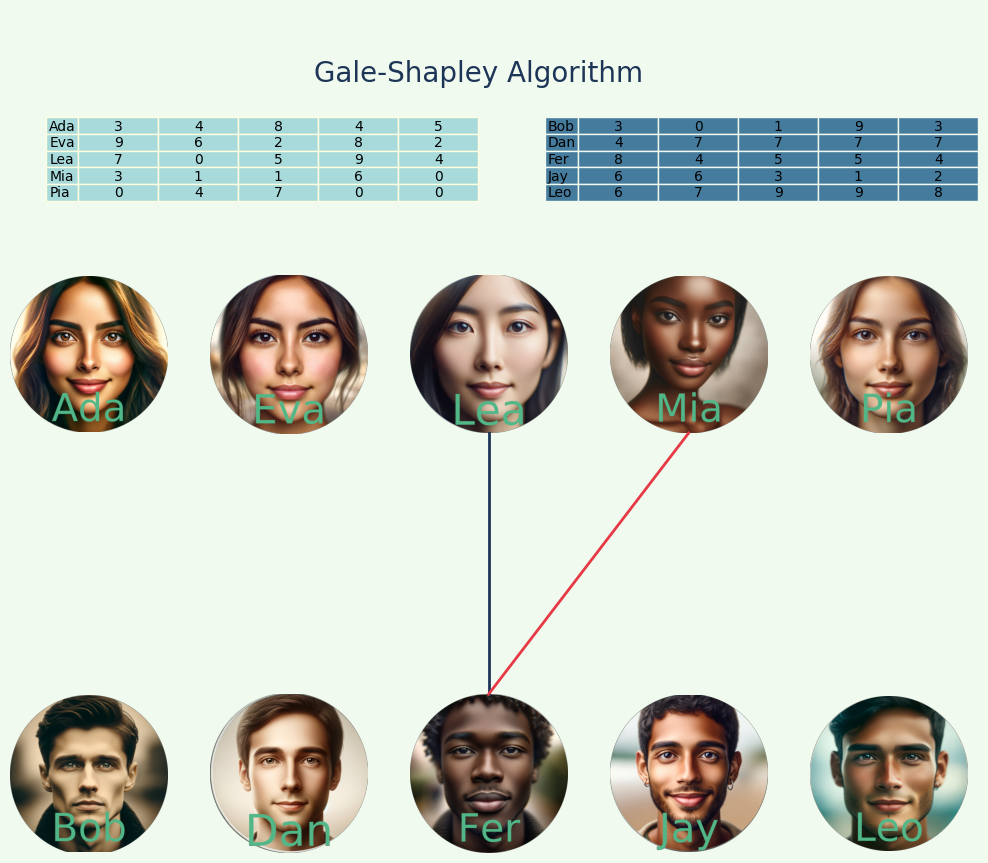

In [375]:
# Example setup: sequence of proposals and relationships for each frame
k=5 ## The number of peopple
people=women_names[:k]+men_names[:k] ## The names of hte people
p_matrix=generate_random_matrix(k,k) ### The preference matrix of the proponents
d_matrix=generate_random_matrix(k,k) ## The preference matrix of the disponents
frame_number=20 ## The number of frames

proposals=[]
relationships=[]
for i in range(frame_number):
    a=np.random.choice(range(k))
    b=np.random.choice(range(k))+k
    proposals.append([(a,b)])
    couples=[]
    for j in range(np.random.choice(range(k))):
        a=np.random.choice(range(k))
        b=np.random.choice(range(k))+k
        couples.append((a,b))
    relationships.append(couples)



# Draw the initial state
fig, axs = draw_commitments(people, [], [],"Gale-Shapley Algorithm",p_matrix,d_matrix)

# Create the animation
ani = FuncAnimation(fig, update, frames=range(len(proposals)), 
                    fargs=(people, proposals, relationships, fig, axs),
                    blit=False)

# Display the animation in Jupyter notebook
HTML(ani.to_jshtml())

In [378]:
ani.save('animation.mp4', dpi=80)  # Lower DPI when saving

In [24]:
women_image_paths

['/Users/camiloariasabad/Desktop/Teaching/Topics_Algorithms_2023/Notebooks_for_Topics_on_Algorithms/Explora_Gale_Shapley/Images_Gale_Shapley/Women/Ada.png',
 '/Users/camiloariasabad/Desktop/Teaching/Topics_Algorithms_2023/Notebooks_for_Topics_on_Algorithms/Explora_Gale_Shapley/Images_Gale_Shapley/Women/Eva.png',
 '/Users/camiloariasabad/Desktop/Teaching/Topics_Algorithms_2023/Notebooks_for_Topics_on_Algorithms/Explora_Gale_Shapley/Images_Gale_Shapley/Women/Zoe.png',
 '/Users/camiloariasabad/Desktop/Teaching/Topics_Algorithms_2023/Notebooks_for_Topics_on_Algorithms/Explora_Gale_Shapley/Images_Gale_Shapley/Women/Lea.png',
 '/Users/camiloariasabad/Desktop/Teaching/Topics_Algorithms_2023/Notebooks_for_Topics_on_Algorithms/Explora_Gale_Shapley/Images_Gale_Shapley/Women/Ema.png',
 '/Users/camiloariasabad/Desktop/Teaching/Topics_Algorithms_2023/Notebooks_for_Topics_on_Algorithms/Explora_Gale_Shapley/Images_Gale_Shapley/Women/Pia.png',
 '/Users/camiloariasabad/Desktop/Teaching/Topics_Algorithm

(<Figure size 1300x1300 with 16 Axes>,
 array([[<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
         <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
         <Axes: >, <Axes: >]], dtype=object))

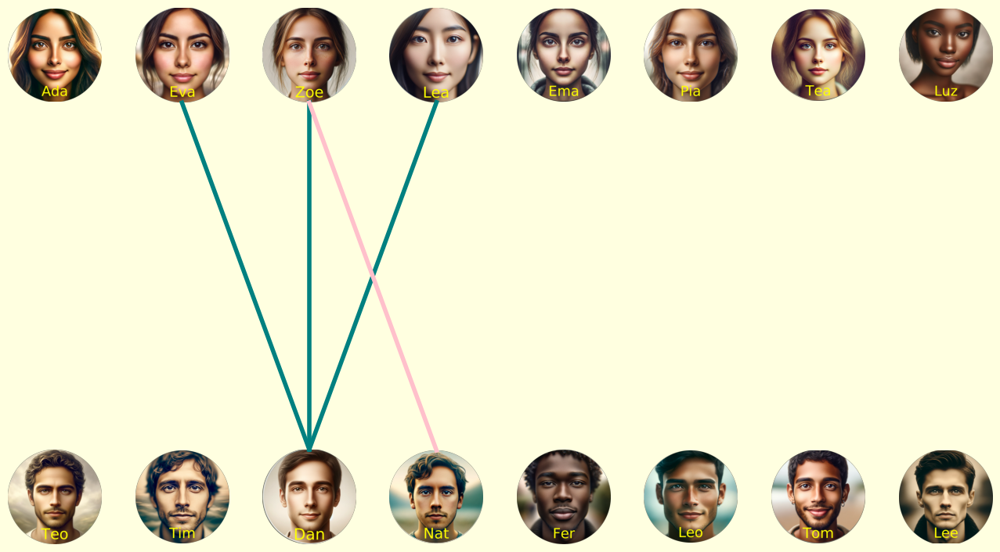

In [177]:
draw_commitments(people, all_proposals[1], all_relationships[0])

In [ ]:
def animate(instance):
    # Set up the figure, the axis, and the plot element
    requests=instance
    fig, ax = plt.subplots()
    lines_data = instance
    N=len(instance)
        
    horlines=[]
    # Plot each horizontal line
    for line in lines_data:
            horline,=ax.plot([line["start"], line["end"]], [line["index"], line["index"]], color='blue')
            horline.set_linewidth(3)
            horlines.append(horline)
    for horline in horlines:
        horline.set_color("blue")
    frames=interval_scheduling_frames(instance)

    def init():
        #ax.set_xlim(0, 10)
        #ax.set_ylim(0, len(instance))
        return *horlines,

    def update(cuadro):
        for line in cuadro["selected"]:
            horlines[line["index"]].set_color("limegreen")
        for line in cuadro["rejected"]:
            horlines[line["index"]].set_color("red")

        return horlines

    ani = FuncAnimation(fig, update, frames=frames,init_func=init,blit=True)
    return HTML(ani.to_jshtml())

In [4]:
coordinates=[]
for i, ax in enumerate(axs.flat):
    position = ax.get_position()
    DX=position.width/2
    DY=position.height
    if i<8:
        DY=0
    coordinates.append((position.x0+DX,position.y0+DY))
    #print(f"Subplot {i+1} - Left: {position.x0}, Bottom: {position.y0}, Width: {position.width}, Height: {position.height}")

In [5]:
coordinates

[(0.0704700854700854, 0.6242664864065453),
 (0.1954700854700854, 0.6231552706552708),
 (0.3204700854700854, 0.623272916912662),
 (0.4454700854700854, 0.6236140439081617),
 (0.5704700854700854, 0.623951443081878),
 (0.6954700854700854, 0.6239512635074767),
 (0.8204700854700854, 0.6247322107581073),
 (0.9454700854700854, 0.623860398860399),
 (0.0704700854700854, 0.3904476533213376),
 (0.1954700854700854, 0.3897399962776847),
 (0.3204700854700854, 0.39071850462094365),
 (0.4454700854700854, 0.3897735901582055),
 (0.5704700854700854, 0.39051979565772665),
 (0.6954700854700854, 0.3893812868466334),
 (0.8204700854700854, 0.39011002000363704),
 (0.9454700854700854, 0.38992975734355045)]

In [25]:
def textsize(text, font):
    im = Image.new(mode="P", size=(0, 0))
    draw = ImageDraw.Draw(im)
    _, _, width, height = draw.textbbox((0, 0), text=text, font=font)
    return width, height

### Write on Pil Image

In [35]:

image_path = women_image_paths[0]
with Image.open(image_path) as img:
    draw = ImageDraw.Draw(img)
    
    # Specify the text and font
    text = "EVA"
    font_size = 150
  # Access the built-in "DejaVuSans" font
 # Use the default font
    font = ImageFont.truetype("DejaVuSans.ttf", font_size)
    
    # Position and color
    text_width, text_height =textsize(text, font=font)
    # Calculate the x-coordinate for the text to be centered
    x = (img.width - text_width) / 2
    # Set the y-coordinate for the vertical position
    y = 0.8*(img.height)  # For example, 10 pixels from the top

    text_position = (x, y)
    text_color = "PINK"
    
    # Draw the text
    draw.text(text_position, text, fill=text_color, font=font)
    
    # Save or display the image
    # output_path = 'path_to_your_output_image.jpg'
    # img.save(output_path)
    img.show()


In [53]:
def write_name(image_path):
    with Image.open(image_path) as img:
        draw = ImageDraw.Draw(img)
        # Split the path by the forward slash
        parts = image_path.split('/')

        # The last part is the file name and remove extention
        text = parts[-1].split(".")[0]
    
        # Access the built-in "DejaVuSans" font
        #Use the default font
        font = ImageFont.truetype("DejaVuSans.ttf", font_size)
        
        # Position and color
        text_width, text_height =textsize(text, font=font)
        # Calculate the x-coordinate for the text to be centered
        x = (img.width - text_width) / 2
        # Set the y-coordinate for the vertical position
        y = 0.8*(img.height)  # For example, 10 pixels from the top

        text_position = (x, y)
        text_color = "YELLOW"
        
        # Draw the text
        draw.text(text_position, text, fill=text_color, font=font)
        
        # Save or display the image
        # output_path = 'path_to_your_output_image.jpg'
        # img.save(output_path)
        return img

In [51]:

written=write_name(image_paths[4])

In [52]:
written.show()

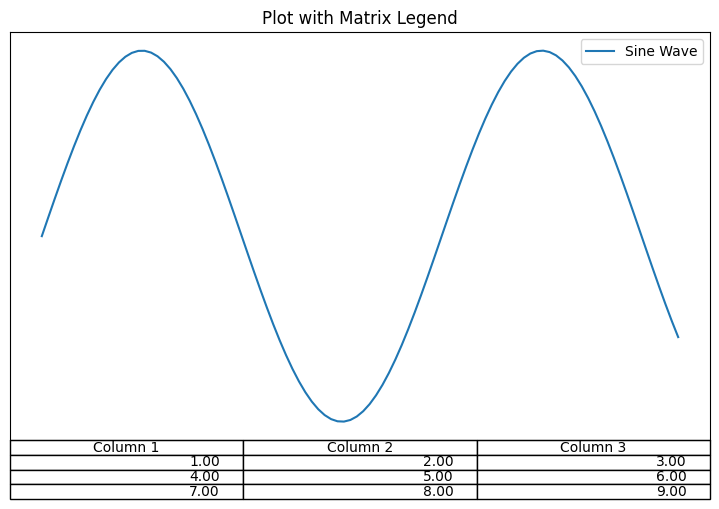

In [43]:
def draw_plot_with_matrix_legend(matrix):
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Example plot data
    x = np.linspace(0, 10, 100)
    y = np.sin(x)
    ax.plot(x, y, label='Sine Wave')
    
    # Setting up the table to display the matrix
    # Convert the matrix to a format suitable for the table
    cell_text = []
    for row in matrix:
        cell_text.append([f"{val:.2f}" for val in row])  # Format the matrix values
    
    # Add a table at the bottom of the axes
    table = ax.table(cellText=cell_text, colLabels=['Column 1', 'Column 2', 'Column 3'], loc='bottom')
    
    # Adjust layout to make room for the table:
    ax.legend()
    plt.subplots_adjust(left=0.2, bottom=0.2)
    
    ax.set_title("Plot with Matrix Legend")
    ax.set_xlabel("X axis")
    ax.set_ylabel("Y axis")
    
    # Hide axes for the table
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    
    plt.show()

# Example matrix
matrix = np.array([[1, 2, 3], [4, 5, 6], [7, 8, 9]])

draw_plot_with_matrix_legend(matrix)

In [147]:
import matplotlib.gridspec as gridspec

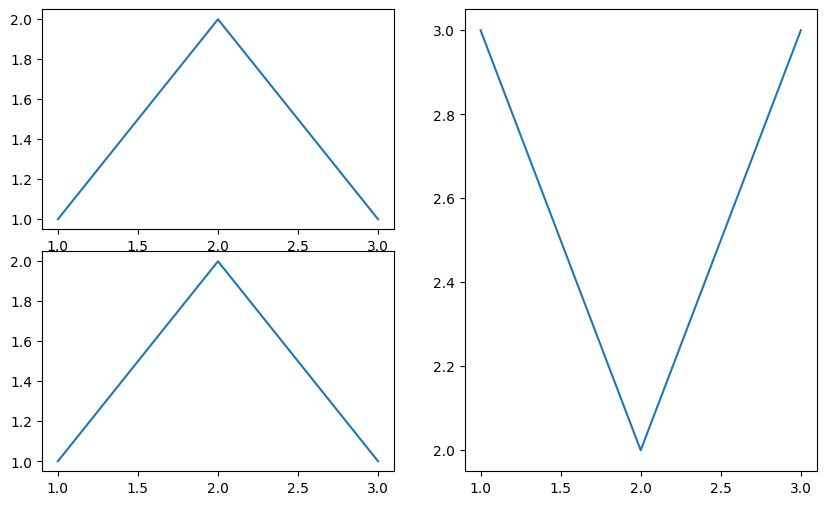

In [151]:

# Create figure and outer gridspec
fig = plt.figure(figsize=(10, 6))
outer_grid = gridspec.GridSpec(1, 2,wspace=0.2, hspace=0.2)

# Create nested gridspec for the first subplot
inner_grid = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=outer_grid[0], wspace=0.1, hspace=0.1)
for i in range(2):
    ax = plt.Subplot(fig, inner_grid[i])
    ax.plot([1, 2, 3], [1, 2, 1])  # Example plot
    fig.add_subplot(ax)

# Second subplot without nesting
ax2 = fig.add_subplot(outer_grid[1])
ax2.plot([1, 2, 3], [3, 2, 3])  # Example plot

plt.show()

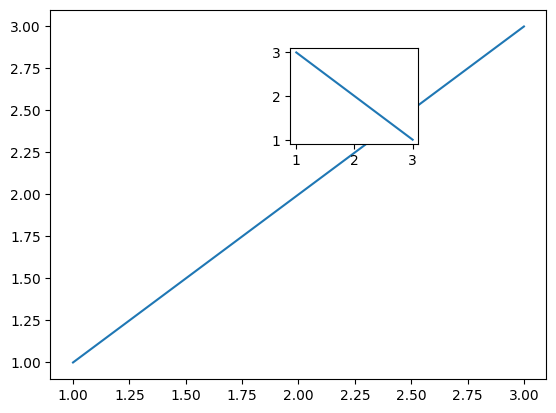

In [153]:
# Create the main figure and a subplot
fig, ax = plt.subplots()
ax.plot([1, 2, 3], [1, 2, 3])  # Example plot

# Add a nested subplot by specifying its position [left, bottom, width, height] in figure coordinates
nested_ax = fig.add_axes([0.5, 0.6, 0.2, 0.2])  # These values can be adjusted
nested_ax.plot([1, 2, 3], [3, 2, 1])  # Example plot in the nested subplot

plt.show()


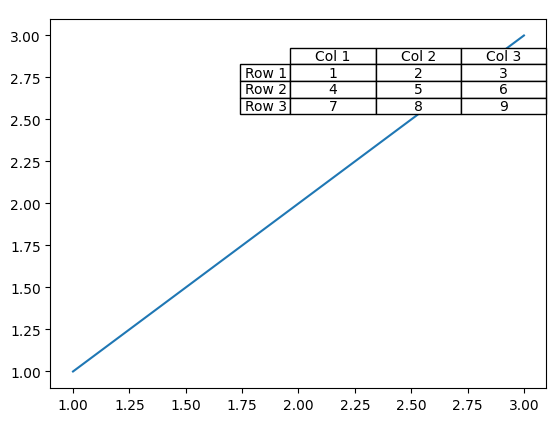

In [154]:
# Create the main figure and subplot
fig, ax = plt.subplots()
ax.plot([1, 2, 3], [1, 2, 3])  # Example main plot

# Define the matrix/data for your table
data = np.array([[1, 2, 3], [4, 5, 6], [7, 8, 9]])
column_labels = ["Col 1", "Col 2", "Col 3"]
row_labels = ['Row 1', 'Row 2', 'Row 3']

# Create an axes area for the table
# The position is [left, bottom, width, height] in figure coordinate system
table_ax = fig.add_axes([0.5, 0.6, 0.4, 0.3])  # Adjust as needed
table_ax.axis('off')  # Hide the axes

# Create the table
the_table = table_ax.table(cellText=data, colLabels=column_labels, rowLabels=row_labels, loc='center', cellLoc='center')
the_table.auto_set_font_size(False)  # Disable automatic font size adjustment
the_table.set_fontsize(10)  # Set font size

plt.show()